In [ ]:
!pip install datasets

In [52]:
import pandas as pd

review_data_df = pd.read_excel('System2_Restaurant Case Study Data.xlsx', sheet_name='Review Data')
review_data_df.head()

,restaurant,review_date,star_rating,review_text
0,Chili's Grill & Bar,2019-07-29,2,My wife and I went there yesterday. We sat at...
1,Chili's Grill & Bar,2018-06-20,1,My boyfriend and I are loyal Chilis customers....
2,Outback Steakhouse,2019-12-03,3,I would just recommend getting a hamburger and...
3,The Cheesecake Factory,2020-03-08,3,Today's selection was not that good the waiter...
4,Texas Roadhouse,2018-03-12,5,Can I get more steak? Texas Roadhouse is alway...


In [53]:
# Group by restaurant to calculate average star rating and review count
restaurant_quality_df = review_data_df.groupby('restaurant').agg(
    average_star_rating=('star_rating', 'mean'),
    review_count=('star_rating', 'size')
).reset_index()

# Sorting 
restaurant_quality_df = restaurant_quality_df.sort_values(by='average_star_rating', ascending=False)

restaurant_quality_df

,restaurant,average_star_rating,review_count
0,Bubba's 33,3.907341,2806
5,Texas Roadhouse,3.536100,10000
2,LongHorn Steakhouse,3.276600,10000
4,Outback Steakhouse,3.079200,10000
3,Olive Garden,3.048500,10000
6,The Cheesecake Factory,2.853200,10000
1,Chili's Grill & Bar,2.629400,10000


In [54]:
# sentiment polarity using TextBlob
from textblob import TextBlob

def get_sentiment_polarity(text):
    return TextBlob(text).sentiment.polarity

review_data_df['sentiment_polarity'] = review_data_df['review_text'].apply(get_sentiment_polarity)

# Aggregate average sentiment polarity for each restaurant chain
restaurant_sentiment = review_data_df.groupby('restaurant')['sentiment_polarity'].agg(['mean', 'count']).reset_index()

In [55]:
restaurant_sentiment.columns = ['restaurant', 'Average Sentiment Polarity', 'Number of Reviews']
restaurant_sentiment = restaurant_sentiment.sort_values(by='Average Sentiment Polarity', ascending=False)
restaurant_sentiment

,restaurant,Average Sentiment Polarity,Number of Reviews
0,Bubba's 33,0.290435,2806
5,Texas Roadhouse,0.249066,10000
2,LongHorn Steakhouse,0.211726,10000
4,Outback Steakhouse,0.188555,10000
3,Olive Garden,0.170107,10000
6,The Cheesecake Factory,0.134823,10000
1,Chili's Grill & Bar,0.105621,10000


In [56]:
import plotly.express as px
review_data_df['review_date'] = pd.to_datetime(review_data_df['review_date'])

# Group the data by restaurant and month/year to calculate the average star rating
review_data_df['year_month'] = review_data_df['review_date'].dt.to_period('M')  # Group by year and month
review_data_df

,restaurant,review_date,star_rating,review_text,sentiment_polarity,year_month
0,Chili's Grill & Bar,2019-07-29,2,My wife and I went there yesterday. We sat at...,-0.082173,2019-07
1,Chili's Grill & Bar,2018-06-20,1,My boyfriend and I are loyal Chilis customers....,-0.157359,2018-06
2,Outback Steakhouse,2019-12-03,3,I would just recommend getting a hamburger and...,-0.283333,2019-12
3,The Cheesecake Factory,2020-03-08,3,Today's selection was not that good the waiter...,0.170000,2020-03
4,Texas Roadhouse,2018-03-12,5,Can I get more steak? Texas Roadhouse is alway...,0.404630,2018-03
...,...,...,...,...,...,...
62801,Bubba's 33,2018-07-22,4,Stopped in here after the movies for an early ...,0.299697,2018-07
62802,Bubba's 33,2018-09-21,5,We love going to Bubbas! The food and service ...,0.445000,2018-09
62803,Bubba's 33,2018-09-08,5,Delicious food and attentive servers!! We will...,0.536979,2018-09
62804,Bubba's 33,2019-11-20,4,Great sports bar in the area with more than en...,0.337500,2019-11


In [57]:
rating_trend_df = review_data_df.groupby(['restaurant', 'year_month'])['star_rating'].mean().reset_index()
rating_trend_df

,restaurant,year_month,star_rating
0,Bubba's 33,2018-01,3.689655
1,Bubba's 33,2018-02,4.187500
2,Bubba's 33,2018-03,3.851852
3,Bubba's 33,2018-04,3.964286
4,Bubba's 33,2018-05,3.869919
...,...,...,...
233,The Cheesecake Factory,2020-06,2.800995
234,The Cheesecake Factory,2020-07,2.854015
235,The Cheesecake Factory,2020-08,2.745968
236,The Cheesecake Factory,2020-09,2.707113


In [58]:
# Convert 'year_month' to a string for Plotly compatibility
rating_trend_df['year_month'] = rating_trend_df['year_month'].astype(str)

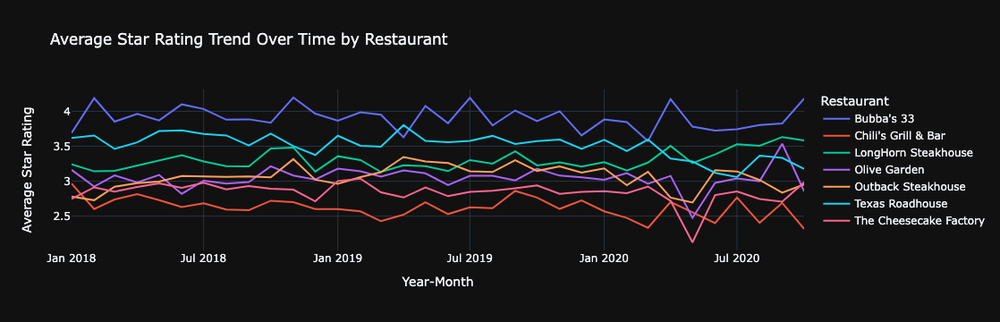

In [59]:
fig = px.line(
    rating_trend_df,
    x='year_month',
    y='star_rating',
    color='restaurant',
    labels={'year_month': 'Year-Month', 'star_rating': 'Average Star Rating'},
    title='Average Star Rating Trend Over Time by Restaurant'
)
# Customizing the layout
fig.update_layout(
    xaxis_title='Year-Month',
    yaxis_title='Average Star Rating',
    hovermode='x unified',  # Show all lines' values when hovering
    legend_title_text='Restaurant',
    template='plotly_dark'  
)

fig.show()

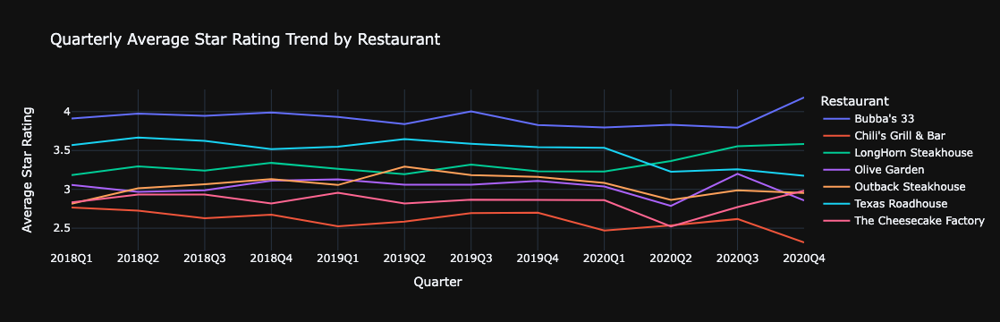

In [60]:
# doing the same thing as above but on quarterly basis

review_data_df['quarter'] = review_data_df['review_date'].dt.to_period('Q')  # Group by quarter
rating_trend_df = review_data_df.groupby(['restaurant', 'quarter'])['star_rating'].mean().reset_index()

rating_trend_df['quarter'] = rating_trend_df['quarter'].astype(str)

fig = px.line(
    rating_trend_df,
    x='quarter',
    y='star_rating',
    color='restaurant',
    labels={'quarter': 'Quarter', 'star_rating': 'Average Star Rating'},
    title='Quarterly Average Star Rating Trend by Restaurant'
)

fig.update_layout(
    xaxis_title='Quarter',
    yaxis_title='Average Star Rating',
    hovermode='x unified',  # 
    legend_title_text='Restaurant',
    template='plotly_dark'
)

fig.show()


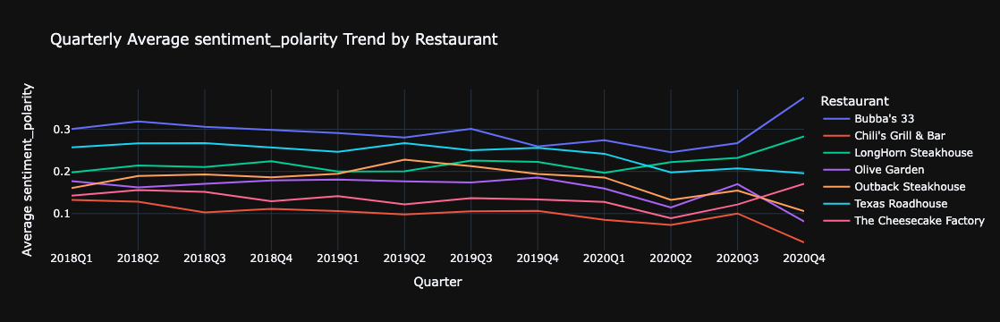

In [61]:
# making the same plot for sentiment polarity

polarity_trend_df = review_data_df.groupby(['restaurant', 'quarter'])['sentiment_polarity'].mean().reset_index()

polarity_trend_df['quarter'] = polarity_trend_df['quarter'].astype(str)

fig = px.line(
    polarity_trend_df,
    x='quarter',
    y='sentiment_polarity',
    color='restaurant',
    labels={'quarter': 'Quarter', 'sentiment_polarity': 'sentiment_polarity'},
    title='Quarterly Average sentiment_polarity Trend by Restaurant'
)

fig.update_layout(
    xaxis_title='Quarter',
    yaxis_title='Average sentiment_polarity',
    hovermode='x unified',  # 
    legend_title_text='Restaurant',
    template='plotly_dark'
)

fig.show()


In [12]:
review_data_df 

,restaurant,review_date,star_rating,review_text,sentiment_polarity,year_month,quarter
0,Chili's Grill & Bar,2019-07-29,2,My wife and I went there yesterday. We sat at...,-0.082173,2019-07,2019Q3
1,Chili's Grill & Bar,2018-06-20,1,My boyfriend and I are loyal Chilis customers....,-0.157359,2018-06,2018Q2
2,Outback Steakhouse,2019-12-03,3,I would just recommend getting a hamburger and...,-0.283333,2019-12,2019Q4
3,The Cheesecake Factory,2020-03-08,3,Today's selection was not that good the waiter...,0.170000,2020-03,2020Q1
4,Texas Roadhouse,2018-03-12,5,Can I get more steak? Texas Roadhouse is alway...,0.404630,2018-03,2018Q1
...,...,...,...,...,...,...,...
62801,Bubba's 33,2018-07-22,4,Stopped in here after the movies for an early ...,0.299697,2018-07,2018Q3
62802,Bubba's 33,2018-09-21,5,We love going to Bubbas! The food and service ...,0.445000,2018-09,2018Q3
62803,Bubba's 33,2018-09-08,5,Delicious food and attentive servers!! We will...,0.536979,2018-09,2018Q3
62804,Bubba's 33,2019-11-20,4,Great sports bar in the area with more than en...,0.337500,2019-11,2019Q4


# Sentiment Analysis using Roberta

In [ ]:
#The below code is from google colab. Did it on colab because I needed GPU access

import pandas as pd
from transformers import pipeline
from datasets import Dataset
import torch

device = 0 if torch.cuda.is_available() else -1 # Check if GPU is available and set device accordingly
review_data_df = pd.read_excel('System2_Restaurant Case Study Data.xlsx', sheet_name='Review Data')

dataset = Dataset.from_pandas(review_data_df[['review_text']]) # Convert the DataFrame to a Hugging Face Dataset for batch processing

# Load the pre-trained RoBERTa-based sentiment analysis model on GPU
sentiment_model = pipeline("sentiment-analysis", model="cardiffnlp/twitter-roberta-base-sentiment", device=device)

# Applying sentiment model in batches
def batch_sentiment_analysis(batch):
    sentiments = sentiment_model(batch['review_text'], truncation=True, max_length=512) #truncated and put max_length = 512 because of the model's limitation
    batch['sentiment'] = [result['label'] for result in sentiments] # Extract the label (Positive, Neutral, or Negative) from the results
    return batch

result_dataset = dataset.map(batch_sentiment_analysis, batched=True, batch_size=32) #doing the sentiment analysis in batches
review_data_df['sentiment'] = result_dataset['sentiment'] # Convert back to a DataFrame for further processing 

# Mapping RoBERTa's sentiment labels to more human-readable labels
label_mapping = {
    'LABEL_0': 'NEGATIVE',
    'LABEL_1': 'NEUTRAL',
    'LABEL_2': 'POSITIVE'
}
review_data_df['sentiment'] = review_data_df['sentiment'].map(label_mapping)
sentiment_summary_df

In [ ]:
# Downloaded the review_data_df from colab and now loading it locally 

In [31]:
review_data_df_1 = review_data_df

In [62]:
review_data_df = pd.read_csv("review_data_df.csv")
review_data_df

,restaurant,review_date,star_rating,review_text,sentiment
0,Chili's Grill & Bar,2019-07-29,2,My wife and I went there yesterday. We sat at...,NEGATIVE
1,Chili's Grill & Bar,2018-06-20,1,My boyfriend and I are loyal Chilis customers....,NEGATIVE
2,Outback Steakhouse,2019-12-03,3,I would just recommend getting a hamburger and...,NEGATIVE
3,The Cheesecake Factory,2020-03-08,3,Today's selection was not that good the waiter...,NEGATIVE
4,Texas Roadhouse,2018-03-12,5,Can I get more steak? Texas Roadhouse is alway...,POSITIVE
...,...,...,...,...,...
62801,Bubba's 33,2018-07-22,4,Stopped in here after the movies for an early ...,POSITIVE
62802,Bubba's 33,2018-09-21,5,We love going to Bubbas! The food and service ...,POSITIVE
62803,Bubba's 33,2018-09-08,5,Delicious food and attentive servers!! We will...,POSITIVE
62804,Bubba's 33,2019-11-20,4,Great sports bar in the area with more than en...,POSITIVE


In [10]:
sentiment_summary_df = review_data_df.groupby(['restaurant', 'sentiment']).size().unstack(fill_value=0) #count each sentiment type by grouping by restaurant
sentiment_summary_df['total_reviews'] = sentiment_summary_df.sum(axis=1) # Adding a total reviews column

# Calculating the percentage of positive and negative reviews
sentiment_summary_df['positive_percentage'] = (sentiment_summary_df['POSITIVE'] / sentiment_summary_df['total_reviews']) * 100
sentiment_summary_df['negative_percentage'] = (sentiment_summary_df['NEGATIVE'] / sentiment_summary_df['total_reviews']) * 100

# Sorting by positive sentiment percentage
sentiment_summary_df = sentiment_summary_df.sort_values(by='positive_percentage', ascending=False)

sentiment_summary_df

sentiment,NEGATIVE,NEUTRAL,POSITIVE,total_reviews,positive_percentage,negative_percentage
restaurant,,,,,,
Bubba's 33,528,88,2190,2806,78.047042,18.816821
Texas Roadhouse,2918,469,6613,10000,66.130000,29.180000
LongHorn Steakhouse,3409,602,5989,10000,59.890000,34.090000
Outback Steakhouse,4016,559,5425,10000,54.250000,40.160000
Olive Garden,4096,540,5364,10000,53.640000,40.960000
The Cheesecake Factory,4595,528,4877,10000,48.770000,45.950000
Chili's Grill & Bar,5229,528,4243,10000,42.430000,52.290000


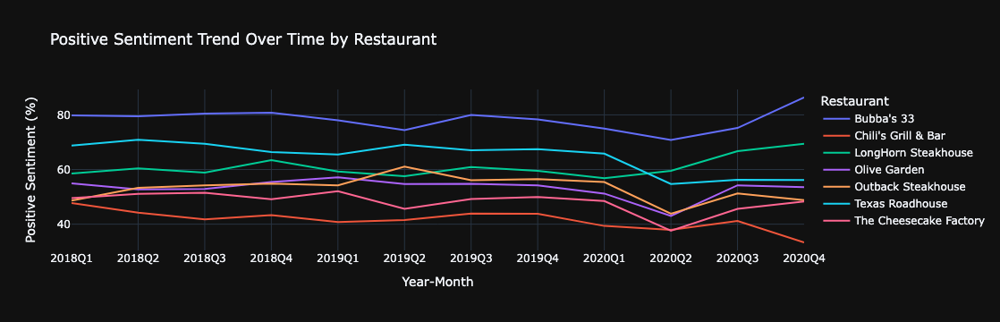

In [12]:
import plotly.express as px

review_data_df['review_date'] = pd.to_datetime(review_data_df['review_date'])
review_data_df['year_month'] = review_data_df['review_date'].dt.to_period('Q')  # Group by quarter
sentiment_over_time_df = review_data_df.groupby(['restaurant', 'year_month', 'sentiment']).size().reset_index(name='count')

# Pivot the dataframe to get sentiment counts in columns (Positive, Neutral, Negative)
sentiment_pivot_df = sentiment_over_time_df.pivot_table(
    index=['restaurant', 'year_month'], 
    columns='sentiment', 
    values='count', 
    fill_value=0
).reset_index()

# Optional: Calculate total reviews and sentiment percentages for each time period
sentiment_pivot_df['total_reviews'] = sentiment_pivot_df['NEGATIVE'] + sentiment_pivot_df['NEUTRAL'] + sentiment_pivot_df['POSITIVE']
sentiment_pivot_df['positive_percentage'] = (sentiment_pivot_df['POSITIVE'] / sentiment_pivot_df['total_reviews']) * 100
sentiment_pivot_df['negative_percentage'] = (sentiment_pivot_df['NEGATIVE'] / sentiment_pivot_df['total_reviews']) * 100
sentiment_pivot_df['year_month'] = sentiment_pivot_df['year_month'].astype(str)

fig = px.line(
    sentiment_pivot_df, 
    x='year_month', 
    y='positive_percentage',  # You can also plot negative_percentage or total reviews
    color='restaurant', 
    labels={'year_month': 'Year-Month', 'positive_percentage': 'Positive Sentiment (%)'},
    title='Positive Sentiment Trend Over Time by Restaurant'
)

fig.update_layout(
    xaxis_title='Year-Month',
    yaxis_title='Positive Sentiment (%)',
    hovermode='x unified',  # Show all restaurants' values when hovering
    legend_title_text='Restaurant',
    template='plotly_dark'  
)

fig.show()

In [35]:
sentiment_summary_with_rating_df = pd.merge(
    sentiment_summary_df,
    restaurant_quality_df[['restaurant', 'average_star_rating']], 
    how='left',  
    on='restaurant'  
)
sentiment_summary_with_rating_df

,restaurant,NEGATIVE,NEUTRAL,POSITIVE,total_reviews,positive_percentage,negative_percentage,average_star_rating
0,Bubba's 33,528,88,2190,2806,78.047042,18.816821,3.907341
1,Texas Roadhouse,2918,469,6613,10000,66.130000,29.180000,3.536100
2,LongHorn Steakhouse,3409,602,5989,10000,59.890000,34.090000,3.276600
3,Outback Steakhouse,4016,559,5425,10000,54.250000,40.160000,3.079200
4,Olive Garden,4096,540,5364,10000,53.640000,40.960000,3.048500
5,The Cheesecake Factory,4595,528,4877,10000,48.770000,45.950000,2.853200
6,Chili's Grill & Bar,5229,528,4243,10000,42.430000,52.290000,2.629400


In [44]:
sentiment_summary_with_rating_polarity_df = pd.merge(
    sentiment_summary_df,
    restaurant_sentiment[['restaurant', 'Average Sentiment Polarity']], 
    how='left',  
    on='restaurant'  
)
sentiment_summary_with_rating_polarity_df

,restaurant,NEGATIVE,NEUTRAL,POSITIVE,total_reviews,positive_percentage,negative_percentage,Average Sentiment Polarity
0,Bubba's 33,528,88,2190,2806,78.047042,18.816821,0.290435
1,Texas Roadhouse,2918,469,6613,10000,66.130000,29.180000,0.249066
2,LongHorn Steakhouse,3409,602,5989,10000,59.890000,34.090000,0.211726
3,Outback Steakhouse,4016,559,5425,10000,54.250000,40.160000,0.188555
4,Olive Garden,4096,540,5364,10000,53.640000,40.960000,0.170107
5,The Cheesecake Factory,4595,528,4877,10000,48.770000,45.950000,0.134823
6,Chili's Grill & Bar,5229,528,4243,10000,42.430000,52.290000,0.105621


In [49]:
review_data_df_1.to_excel('rvdf1.xlsx', index = False)

In [48]:
review_data_df.to_excel('rvdf2.xlsx', index = False)

In [ ]:
# Trying to see what positive, negative and neutral ratings comprise of using top 50 frequent words 

In [50]:
import pandas as pd
import re
import nltk
from collections import Counter
from nltk.corpus import stopwords
nltk.download('stopwords') # Download stopwords for text cleaning
stop_words = set(stopwords.words('english'))

# clean the review text
def preprocess_text(text):
    text = text.lower()  # Convert to lowercase
    text = re.sub(r'[^\w\s]', '', text)  # Remove punctuation
    text = ' '.join([word for word in text.split() if word not in stop_words])  # Remove stopwords
    return text

review_data_df['cleaned_review'] = review_data_df['review_text'].apply(preprocess_text) # Apply preprocessing to review_text

#getting top n frequent words for a given sentiment
def get_top_n_frequent_words(reviews, n=50):
    all_words = ' '.join(reviews).split()  
    word_freq = Counter(all_words)  
    return word_freq.most_common(n) 

#get top frequent words for each restaurant by sentiment
def get_top_words_by_sentiment(df, sentiment_label, n=50):
    top_words = {}
    sentiment_df = df[df['sentiment'] == sentiment_label]
    for restaurant in sentiment_df['restaurant'].unique():
        restaurant_reviews = sentiment_df[sentiment_df['restaurant'] == restaurant]['cleaned_review']
        
        # Get the top n frequent words for the restaurant's reviews
        top_words[restaurant] = get_top_n_frequent_words(restaurant_reviews, n=n)
    
    return top_words

top_positive_words = get_top_words_by_sentiment(review_data_df, 'POSITIVE', n=50)
top_negative_words = get_top_words_by_sentiment(review_data_df, 'NEGATIVE', n=50)
top_neutral_words = get_top_words_by_sentiment(review_data_df, 'NEUTRAL', n=50)

print("Top 50 Frequent Words in Positive Reviews by Restaurant:")
for restaurant, words in top_positive_words.items():
    print(f"\nRestaurant: {restaurant}\nWords: {words}")
print("\nTop 50 Frequent Words in Negative Reviews by Restaurant:")
for restaurant, words in top_negative_words.items():
    print(f"\nRestaurant: {restaurant}\nWords: {words}")
print("\nTop 50 Frequent Words in Neutral Reviews by Restaurant:")
for restaurant, words in top_neutral_words.items():
    print(f"\nRestaurant: {restaurant}\nWords: {words}")


[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/ritvikkhandelwal/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


Top 50 Frequent Words in Positive Reviews by Restaurant:

Restaurant: Texas Roadhouse
Words: [('food', 4549), ('great', 4263), ('good', 4037), ('service', 3209), ('steak', 3188), ('always', 2529), ('place', 2290), ('time', 2248), ('texas', 2124), ('roadhouse', 1937), ('us', 1806), ('wait', 1655), ('get', 1627), ('back', 1526), ('like', 1509), ('one', 1429), ('go', 1429), ('love', 1408), ('ordered', 1406), ('rolls', 1366), ('server', 1355), ('well', 1331), ('came', 1291), ('cooked', 1284), ('delicious', 1283), ('really', 1246), ('best', 1231), ('got', 1224), ('amazing', 1187), ('staff', 1167), ('friendly', 1163), ('butter', 1125), ('steaks', 1106), ('restaurant', 1085), ('bread', 1071), ('would', 1039), ('dinner', 1012), ('salad', 988), ('nice', 982), ('also', 980), ('order', 980), ('experience', 960), ('even', 952), ('meal', 946), ('table', 907), ('come', 893), ('never', 858), ('first', 858), ('definitely', 844), ('chicken', 840)]

Restaurant: Outback Steakhouse
Words: [('food', 3537),

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/ritvikkhandelwal/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


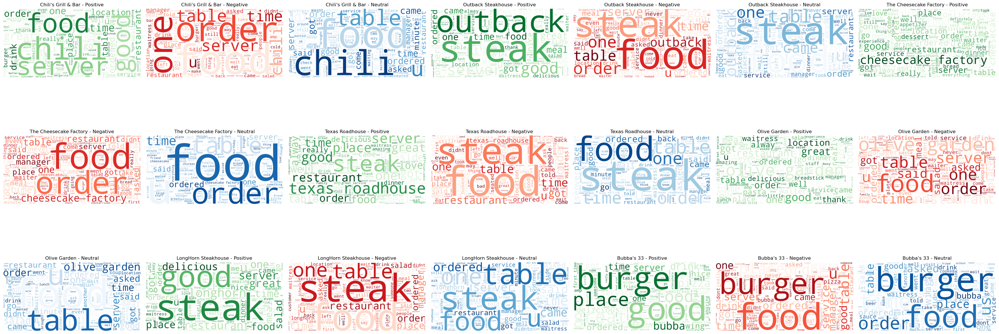

In [69]:
# word cloud for all words

import pandas as pd
import re
import nltk
from collections import Counter
from nltk.corpus import stopwords
from wordcloud import WordCloud
import matplotlib.pyplot as plt

review_data_df = pd.read_csv("review_data_df.csv")
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))
def preprocess_text(text):
    text = text.lower() 
    text = re.sub(r'[^\w\s]', '', text)  
    text = ' '.join([word for word in text.split() if word not in stop_words]) 
    return text
review_data_df['cleaned_review'] = review_data_df['review_text'].apply(preprocess_text)

def get_all_words(reviews):
    all_words = ' '.join(reviews).split()  
    return ' '.join(all_words)  

def generate_word_cloud(words, colormap):
    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap=colormap).generate(words)
    return wordcloud

def create_combined_word_clouds(df):
    fig, axes = plt.subplots(3, 7, figsize=(35, 15)) 
    axes = axes.flatten()
    count = 0
    for restaurant in df['restaurant'].unique():
        positive_reviews = df[(df['restaurant'] == restaurant) & (df['sentiment'] == 'POSITIVE')]['cleaned_review']
        negative_reviews = df[(df['restaurant'] == restaurant) & (df['sentiment'] == 'NEGATIVE')]['cleaned_review']
        neutral_reviews = df[(df['restaurant'] == restaurant) & (df['sentiment'] == 'NEUTRAL')]['cleaned_review']
        positive_words = get_all_words(positive_reviews)
        negative_words = get_all_words(negative_reviews)
        neutral_words = get_all_words(neutral_reviews)
        wordcloud_pos = generate_word_cloud(positive_words, 'Greens')
        wordcloud_neg = generate_word_cloud(negative_words, 'Reds')
        wordcloud_neu = generate_word_cloud(neutral_words, 'Blues')
        for i, wordcloud in enumerate([wordcloud_pos, wordcloud_neg, wordcloud_neu]):
            ax = axes[count]
            ax.imshow(wordcloud, interpolation='bilinear')
            ax.set_title(f'{restaurant} - {["Positive", "Negative", "Neutral"][i]}')
            ax.axis('off')
            count += 1
    plt.tight_layout()
    plt.savefig('combined_wordclouds_3x7.png')
    plt.show()
create_combined_word_clouds(review_data_df)


[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/ritvikkhandelwal/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


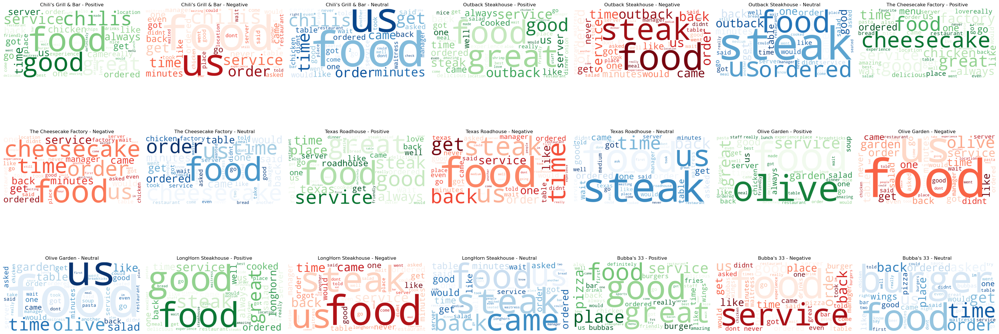

In [71]:
# word cloud for top 50 words 

import pandas as pd
import re
import nltk
from collections import Counter
from nltk.corpus import stopwords
from wordcloud import WordCloud
import matplotlib.pyplot as plt

review_data_df = pd.read_csv("review_data_df.csv")

nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

def preprocess_text(text):
    text = text.lower()
    text = re.sub(r'[^\w\s]', '', text)
    text = ' '.join([word for word in text.split() if word not in stop_words])
    return text

review_data_df['cleaned_review'] = review_data_df['review_text'].apply(preprocess_text)

def get_top_words(reviews, top_n=50):
    all_words = ' '.join(reviews).split()
    word_counts = Counter(all_words)
    top_words = dict(word_counts.most_common(top_n))
    return top_words

def generate_word_cloud(word_freq_dict, colormap):
    wordcloud = WordCloud(width=800, height=400, background_color='white', colormap=colormap).generate_from_frequencies(word_freq_dict)
    return wordcloud

def create_combined_word_clouds(df):
    fig, axes = plt.subplots(3, 7, figsize=(35, 15))
    axes = axes.flatten()
    count = 0
    for restaurant in df['restaurant'].unique():
        positive_reviews = df[(df['restaurant'] == restaurant) & (df['sentiment'] == 'POSITIVE')]['cleaned_review']
        negative_reviews = df[(df['restaurant'] == restaurant) & (df['sentiment'] == 'NEGATIVE')]['cleaned_review']
        neutral_reviews = df[(df['restaurant'] == restaurant) & (df['sentiment'] == 'NEUTRAL')]['cleaned_review']
        positive_words = get_top_words(positive_reviews)
        negative_words = get_top_words(negative_reviews)
        neutral_words = get_top_words(neutral_reviews)
        wordcloud_pos = generate_word_cloud(positive_words, 'Greens')
        wordcloud_neg = generate_word_cloud(negative_words, 'Reds')
        wordcloud_neu = generate_word_cloud(neutral_words, 'Blues')
        for i, wordcloud in enumerate([wordcloud_pos, wordcloud_neg, wordcloud_neu]):
            ax = axes[count]
            ax.imshow(wordcloud, interpolation='bilinear')
            ax.set_title(f'{restaurant} - {["Positive", "Negative", "Neutral"][i]}')
            ax.axis('off')
            count += 1
    plt.tight_layout()
    plt.savefig('combined_wordclouds_top50_3x7.png')
    plt.show()

create_combined_word_clouds(review_data_df)
